# 4.7. Решение с плоской границей

Материалы курсов "Исследования скважин и пластов" и "Гидродинамические исследования скважин" в РГУ нефти и газа имени И.М.Губкина.

версия 0.2 от 22.10.2023

Хабибуллин Ринат 2021-2023 г.

---

In [1]:
# импортируем библиотки, которые могут пригодиться для проведения расчетов
import numpy as np
import matplotlib.pyplot as plt
from anaflow import get_lap_inv
from scipy.special import kn, iv, expi


In [2]:
def pd_ei(td, rd):
    return -0.5 * expi(-rd**2/4/td)

# пример функции реализующий расчет решения в пространстве Лапласа
def pd_lapl_finite_rw(u, rd=1):
    """
    расчет решения c конечным радиусом скважины для безразмерного давления в пространстве Лапласа
    u - переменная пространства Лапласа
    rd- безразмерное расстояние от центра скважины
    """
    return 1 / u**(3/2) * kn(0, rd * u**0.5) / kn(1, u**0.5)

In [3]:
# решение линейного стока в пространстве Лапласа
def pd_lapl_wbs(pd_lapl, rd=1,  S=0, Cd=0, **kwargs):
    def pdl(s, rd=1, S=0, Cd=0, **kwargs):
        return 1 / s * (S + s * pd_lapl(s, rd=rd, **kwargs)) / (1 + s * Cd * (S + s * pd_lapl(s, rd=rd, **kwargs)))
    return pdl

# построим функцию инвертирующую решение в пространстве Лапласа

# функция расчета безразмерного давления с использованием алгоритма Стефеста
# для численного обратного преобразования Лапласа
def pd_inv(pd_lapl, td, rd, **kwargs):
     
    
    if isinstance(rd, np.ndarray):
        # если на входе массив, то вручную итерируем по всем элементам и 
        # собираем массив массивов
        return np.array(list(map(lambda r: pd_inv(pd_lapl, td, rd=r, **kwargs), rd)))
    else:
        pd_inv_ = get_lap_inv(pd_lapl, rd=rd, **kwargs)
        return pd_inv_(td)

In [4]:
# определим функцию которая строит решение с учетом влияния ствола скважины
pd_inf = pd_lapl_wbs(pd_lapl_finite_rw, S=5, Cd = 1e-3)


In [5]:
# пример вызова обратного преобразования Лапласа для построенного решения
pd_arr_inf = pd_inv(pd_inf, td=1, rd=1, S=0, Cd=0)

In [6]:
# зададим координатную сетку
x = np.linspace(-500, 500, 500)
y = np.linspace(-500, 500, 500)

In [7]:
xv, yv = np.meshgrid(x, y)

In [8]:
xwell1 = 100
ywell1 = -250

In [9]:
pdmesh = pd_ei(td=100000,rd= ((xv-xwell1)**2 + (yv-ywell1)**2)**0.5 )

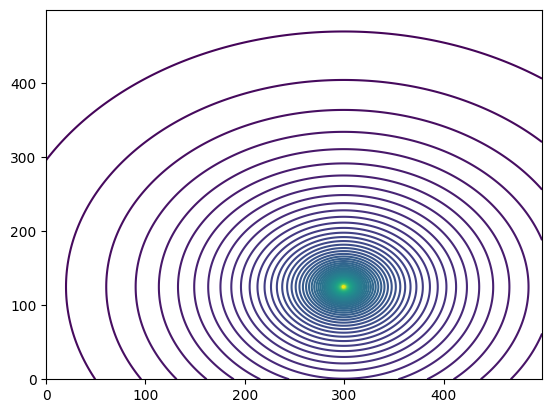

In [10]:
plt.contour(pdmesh, levels=100)
plt.show()

In [11]:
xwell1 = 200
ywell1 = 200

xwell2 = 100
ywell2 = 0

In [12]:
pdmesh = (pd_ei(td=100000,rd= ((xv-xwell1)**2 + (yv-ywell1)**2)**0.5 ) - 
          4* pd_ei(td=100000,rd= ((xv)**2 + (yv)**2)**0.5 ) +
          pd_ei(td=100000,rd= ((xv+xwell1)**2 + (yv-ywell1)**2)**0.5 ) + 
          pd_ei(td=100000,rd= ((xv-xwell1)**2 + (yv+ywell1)**2)**0.5 )+
          pd_ei(td=100000,rd= ((xv+xwell1)**2 + (yv+ywell1)**2)**0.5 ) )

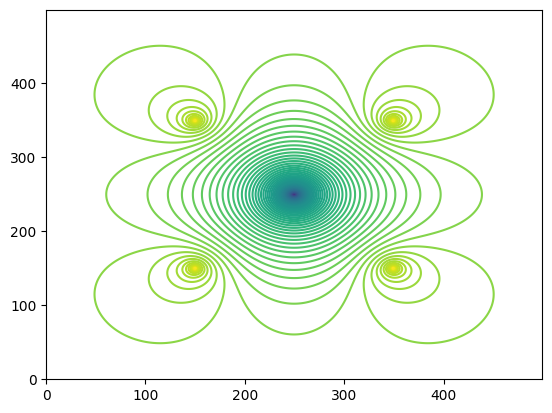

In [13]:
plt.contour(pdmesh, levels=100)
plt.show()

In [14]:
import plotly.express as px

In [15]:
import plotly.graph_objects as go

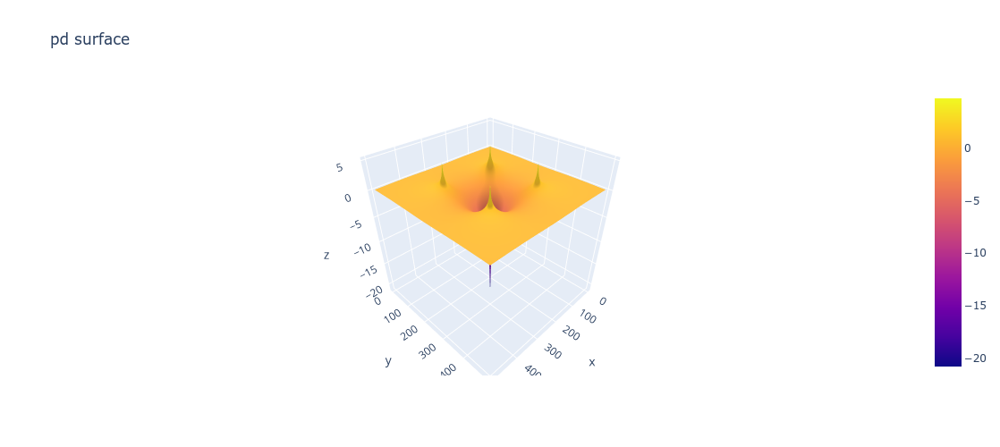

In [16]:
fig = go.Figure(data=[go.Surface(z=pdmesh)])

fig.update_layout(title='pd surface',
                  width=500, height=500)

fig.show()

In [17]:
xwell1 = 200
ywell1 = 0

xwell2 = -200
ywell2 = 0

In [18]:
pdmesh = (pd_ei(td=100,rd= ((xv-xwell1)**2 + (yv-ywell1)**2)**0.5 ) + 
          pd_ei(td=100,rd= ((xv-xwell2)**2 + (yv-ywell2)**2)**0.5 ) )

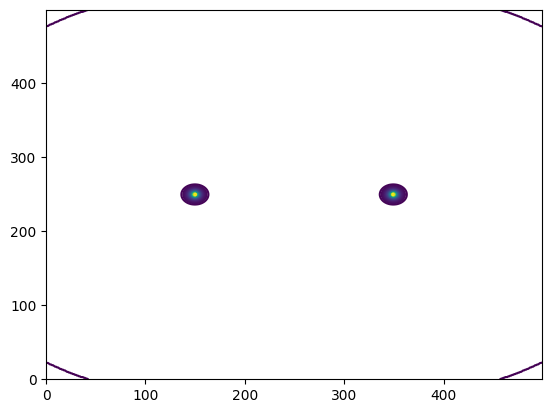

In [19]:
plt.contour(pdmesh, levels=100)
plt.show()

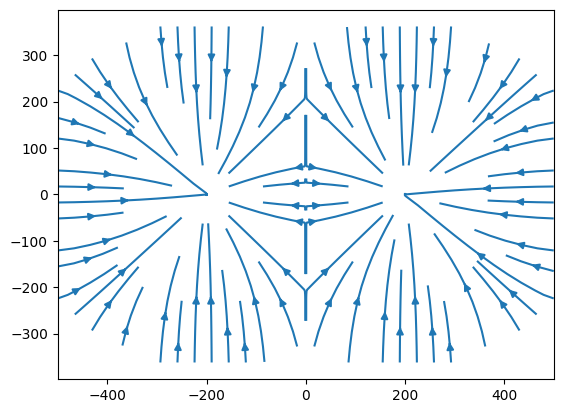

In [20]:
plt.streamplot(xv, yv, np.gradient(pdmesh,axis=1), np.gradient(pdmesh,axis=0))

In [21]:
def pd_plane(td, red, rd=1):
    return pd_ei(td, rd=1) + pd_ei(td, rd=red*2)

In [22]:
td_arr = np.linspace(1, 1e6, 100)
pd_arr = pd_plane(td_arr, red = 100)

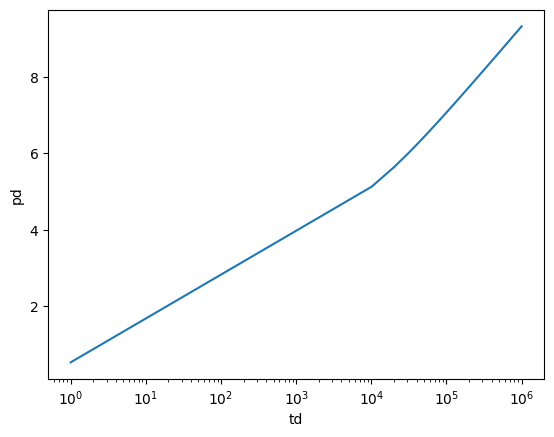

In [23]:
plt.plot(td_arr, pd_arr)
plt.xscale('log')
plt.xlabel('td')
plt.ylabel('pd')
plt.show()

In [24]:
pd_super = pd_lapl_wbs(pd_plane)

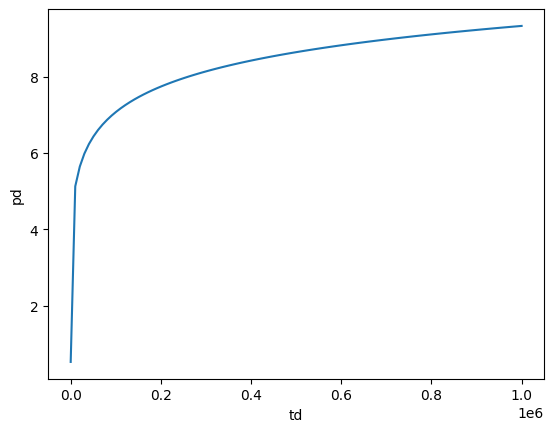

In [28]:
td_arr = np.linspace(1, 1e6, 100)
pd_arr = pd_super(td_arr,rd=1, red = 100, Cd=0)

plt.plot(td_arr, pd_arr)
#plt.xscale('log')
plt.xlabel('td')
plt.ylabel('pd')
plt.show()